In [1]:
class Fuzzy:
    def __init__(self):
        self.min = 0
        self.max = 0

    def down(self, x):
        return (self.max - x) / (self.max - self.min)

    def up(self, x):
        return (x - self.min) / (self.max - self.min)

    def rev_down(self, value):
        return self.max - value * (self.max - self.min)

    def rev_up(self, value):
        return value * (self.max - self.min) + self.min


In [2]:
class ServiceSpeed(Fuzzy):
    def __init__(self):
        self.min = 1
        self.max = 10

    def slow(self, x):
        if x <= self.min: return 1
        if x >= self.max: return 0
        return self.down(x)

    def fast(self, x):
        if x <= self.min: return 0
        if x >= self.max: return 1
        return self.up(x)


In [3]:
class FoodQuality(Fuzzy):
    def __init__(self):
        self.min = 1
        self.max = 10

    def bad(self, x):
        if x <= self.min: return 1
        if x >= self.max: return 0
        return self.down(x)

    def good(self, x):
        if x <= self.min: return 0
        if x >= self.max: return 1
        return self.up(x)


In [4]:
class Ambiance(Fuzzy):
    def __init__(self):
        self.min = 1
        self.max = 10

    def unpleasant(self, x):
        if x <= self.min: return 1
        if x >= self.max: return 0
        return self.down(x)

    def pleasant(self, x):
        if x <= self.min: return 0
        if x >= self.max: return 1
        return self.up(x)


In [5]:
class Happiness(Fuzzy):
    def __init__(self):
        self.min = 1
        self.max = 10

    def unhappy(self, fuzzy_value):
        return self.rev_down(fuzzy_value)

    def happy(self, fuzzy_value):
        return self.rev_up(fuzzy_value)


In [6]:
# Rules
rule_map = {
    ("slow", "bad", "unpleasant"): "unhappy",
    ("slow", "bad", "pleasant"): "unhappy",
    ("slow", "good", "pleasant"): "unhappy",
    ("fast", "good", "pleasant"): "happy",
    ("fast", "good", "unpleasant"): "happy",
    ("fast", "bad", "unpleasant"): "unhappy",
}


In [7]:
# Input Data
speed = 9  # Kecepatan Pelayanan (skala 1-10)
quality = 9  # Kualitas Makanan (skala 1-10)
ambiance = 6  # Suasana (skala 1-10)

# Fuzzy Evaluation
speed_eval = ServiceSpeed()
quality_eval = FoodQuality()
ambiance_eval = Ambiance()
happiness_eval = Happiness()

fuzzy_real = 0
fuzzy = 0


In [8]:
for rule in rule_map:
    fuzzy_speed = speed_eval.slow(speed) if rule[0] == "slow" else speed_eval.fast(speed)
    fuzzy_quality = quality_eval.bad(quality) if rule[1] == "bad" else quality_eval.good(quality)
    fuzzy_ambiance = ambiance_eval.unpleasant(ambiance) if rule[2] == "unpleasant" else ambiance_eval.pleasant(ambiance)

    fuzzy_happiness = min(fuzzy_speed, fuzzy_quality, fuzzy_ambiance)
    happiness = happiness_eval.unhappy(fuzzy_happiness) if rule_map[rule] == "unhappy" else happiness_eval.happy(fuzzy_happiness)

    fuzzy_real += fuzzy_happiness * happiness
    fuzzy += fuzzy_happiness


In [9]:
result = fuzzy_real / fuzzy

print(f"Tingkat kebahagiaan pelanggan adalah {result:.2f} dari skala 1-10.")


Tingkat kebahagiaan pelanggan adalah 6.62 dari skala 1-10.


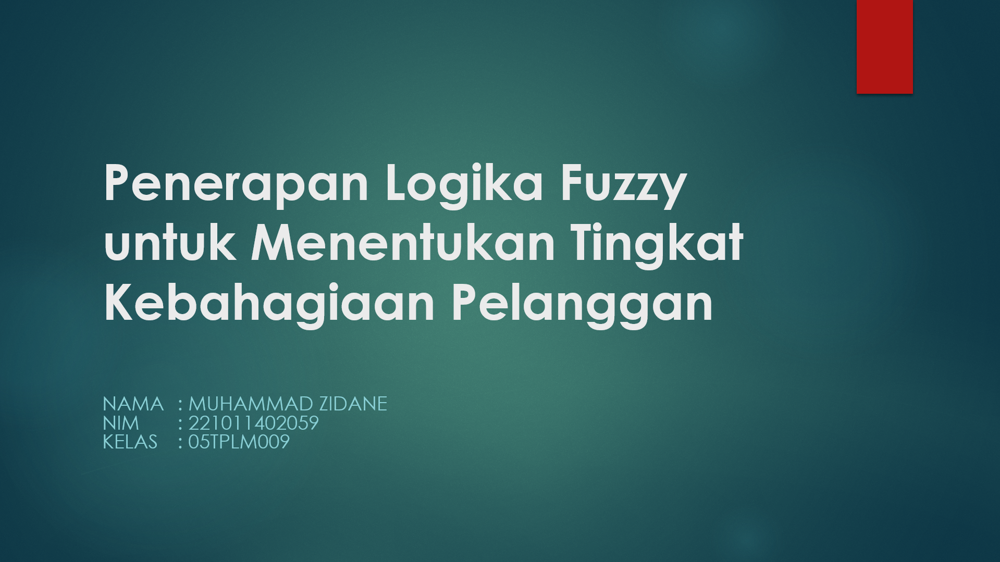

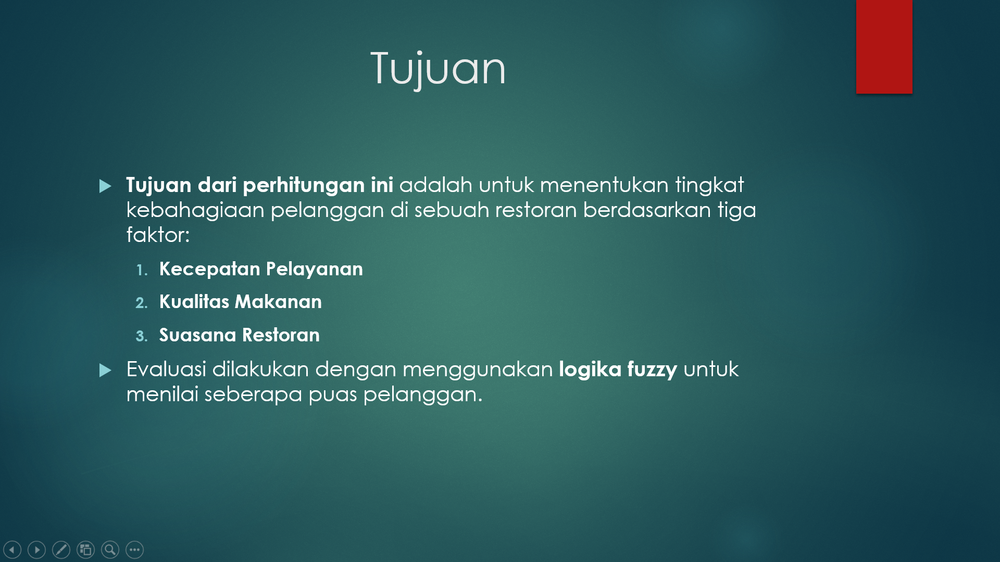

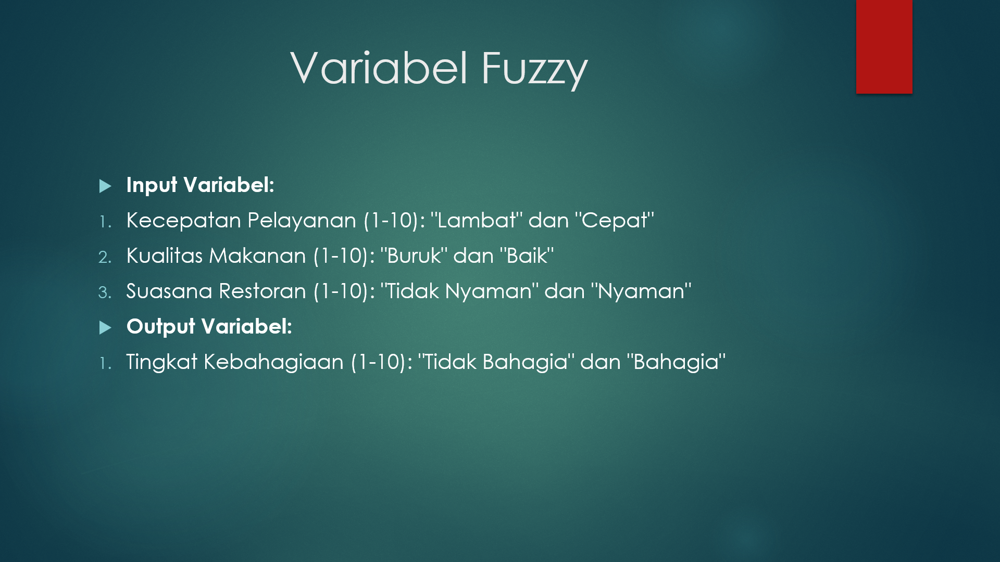

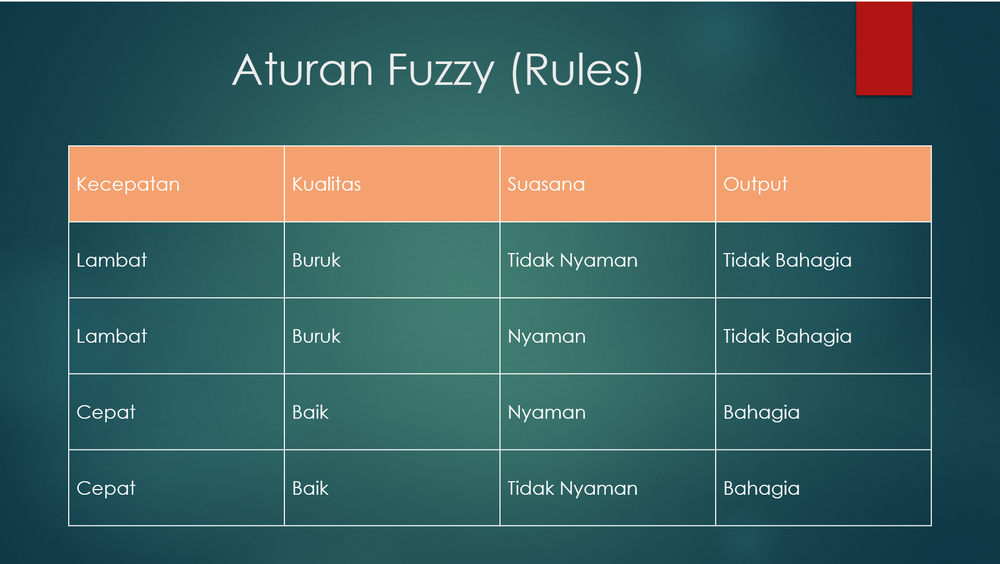

![Deskripsi Gambar](UAS/slide/2.png)


![Deskripsi Gambar](UAS/slide/3.png)

![Deskripsi Gambar](UAS/slide/4.png)


![Deskripsi Gambar](UAS/slide/5.png)
